# Part 2 - Multiple Video Analysis

## Table of Contents
1. [Determine all detected objects](#section1)
2. [Determine all detected emotions](#section2)
3. [Person identification through different debates](#section3)  
    &nbsp;&nbsp;&nbsp;&nbsp;3.1 [Compare the image embeddings between two videos for a selected party](#section3.1)  
    &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3.1.1 [Using PCA](#section3.1.1)  
    &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3.1.2 [Alternative to PCA: Clustering with UMAP](#section3.1.2)  
    &nbsp;&nbsp;&nbsp;&nbsp;3.2 [Compare image embeddings between a party's videos using only single person scenes](#section3.2)  
    &nbsp;&nbsp;&nbsp;&nbsp;3.3 [Visualize image and face embeddings relationship](#section3.3)

        

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import math
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
from collections import defaultdict
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import random
from sklearn.mixture import GaussianMixture
from scipy.spatial.distance import cdist
from collections import Counter
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
import copy
from scipy.stats import pearsonr
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.cluster import SpectralClustering
from sklearn.manifold import Isomap

In [2]:
# Set global seed
random_seed = 0
np.random.seed(random_seed)

## List of available electoral debates

In [3]:
videos = [f for f in os.listdir('videos')]
print(videos)

['ad-be', 'ad-cdu', 'ad-chega', 'ad-il', 'ad-livre', 'ad-pan', 'ad-ps', 'be-ps', 'cdu-be', 'cdu-ps', 'chega-be', 'chega-cdu', 'chega-il', 'chega-ps', 'il-be', 'il-cdu', 'il-ps', 'livre-be', 'livre-cdu', 'livre-chega', 'livre-il', 'livre-ps', 'pan-be', 'pan-cdu', 'pan-chega', 'pan-il', 'pan-livre', 'pan-ps']


In [4]:
dfs = defaultdict(pd.DataFrame)
for video in videos:
    df = pd.read_pickle(os.path.join('pickles', video + '.pkl'))
    df = df.sort_values(by='filename').reset_index(drop=True)
    dfs[video] = df

In [5]:
# Check the keys
dfs.keys()

dict_keys(['ad-be', 'ad-cdu', 'ad-chega', 'ad-il', 'ad-livre', 'ad-pan', 'ad-ps', 'be-ps', 'cdu-be', 'cdu-ps', 'chega-be', 'chega-cdu', 'chega-il', 'chega-ps', 'il-be', 'il-cdu', 'il-ps', 'livre-be', 'livre-cdu', 'livre-chega', 'livre-il', 'livre-ps', 'pan-be', 'pan-cdu', 'pan-chega', 'pan-il', 'pan-livre', 'pan-ps'])

In [6]:
# Check one dataframe
dfs['ad-be'].head()

,filename,detections,poses,faces,text,embedding,fer
0,img00001.jpeg,"[[265, 52, 828, 673, person, 0.94140625]]","[[[0.4862446188926697, 0.35852527618408203, -0...","[[[0.4748454988002777, 0.40552443265914917, -0...",[],"[253, 4, 253, 1, 2, 6, 255, 253, 1, 1, 253, 3,...","[{'location': [482, 741, 105, 365], 'embedding..."
1,img00002.jpeg,"[[278, 38, 828, 673, person, 0.94140625]]","[[[0.48350581526756287, 0.35224926471710205, -...","[[[0.47546878457069397, 0.4042942523956299, -0...",[],"[253, 3, 253, 2, 3, 5, 255, 253, 2, 1, 253, 4,...","[{'location': [482, 742, 104, 365], 'embedding..."
2,img00003.jpeg,"[[248, 59, 860, 660, person, 0.92578125]]","[[[0.49067580699920654, 0.37244391441345215, -...","[[[0.47725796699523926, 0.4246514141559601, -0...",[],"[253, 3, 253, 0, 3, 6, 0, 253, 2, 2, 253, 6, 6...","[{'location': [493, 750, 121, 379], 'embedding..."
3,img00004.jpeg,"[[265, 59, 828, 660, person, 0.9375]]","[[[0.49766069650650024, 0.3745940923690796, -0...","[[[0.4811995029449463, 0.42986831068992615, -0...",[],"[253, 4, 254, 0, 4, 3, 0, 253, 2, 2, 253, 4, 7...","[{'location': [493, 753, 120, 381], 'embedding..."
4,img00005.jpeg,"[[248, 65, 860, 648, person, 0.93359375]]","[[[0.493888258934021, 0.387317419052124, -0.67...","[[[0.48391252756118774, 0.4281001687049866, -0...",[],"[253, 3, 253, 0, 3, 5, 255, 253, 2, 2, 253, 4,...","[{'location': [493, 750, 128, 386], 'embedding..."


### Visualize data

In [7]:
# Function to visualize a frame of a video given its index in the dataframe.
def view_frame(video, df, index):

    frame_id = df.iloc[index]['filename']
    img = Image.open(os.path.join('videos', video, frame_id))
    plt.imshow(img)
    plt.show()

Debate ad-be:


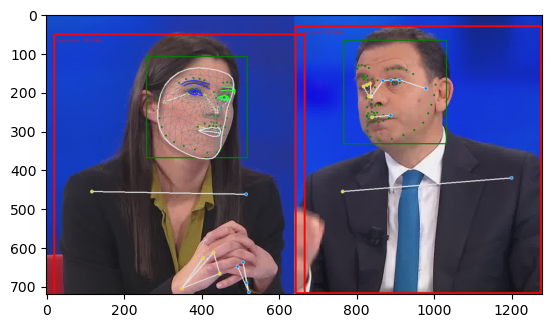

Debate ad-cdu:


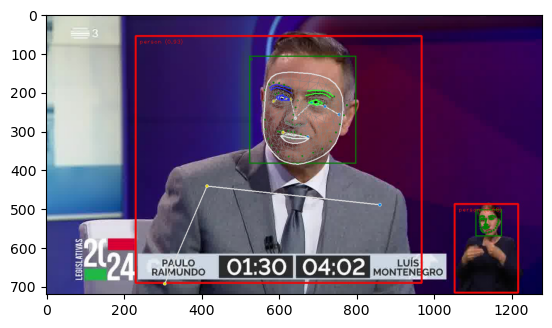

Debate ad-chega:


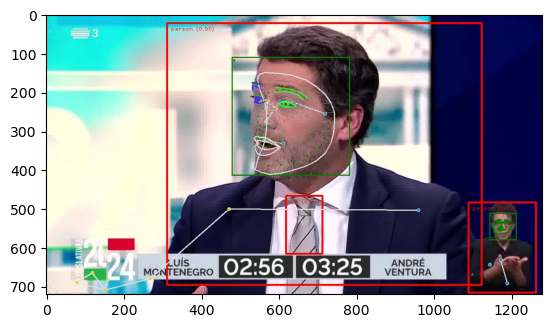

Debate ad-il:


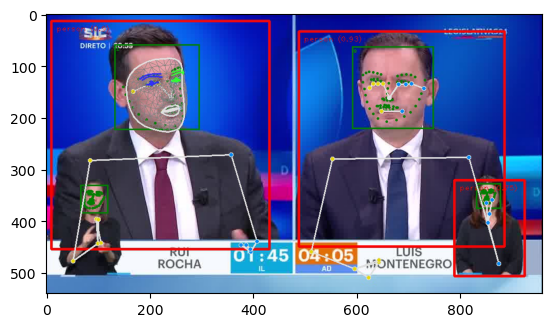

Debate ad-livre:


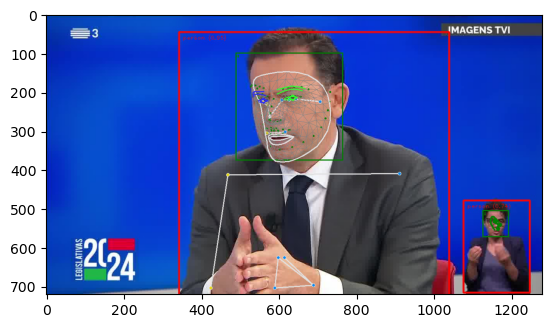

Debate ad-pan:


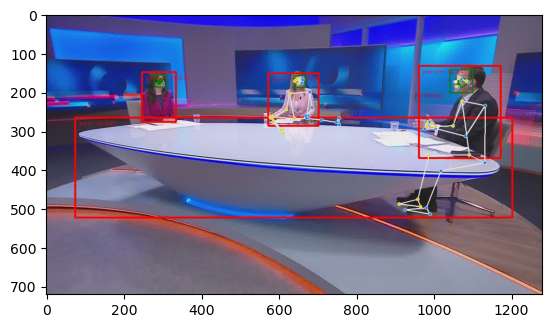

Debate ad-ps:


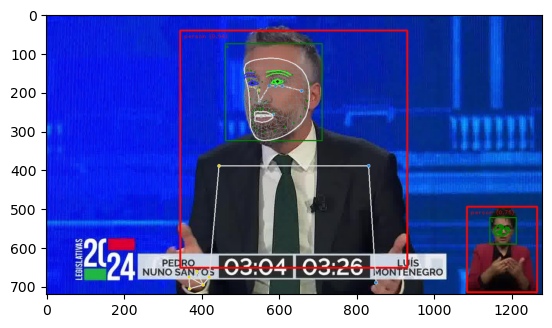

Debate be-ps:


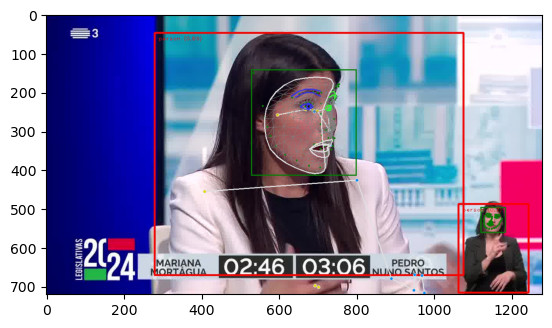

Debate cdu-be:


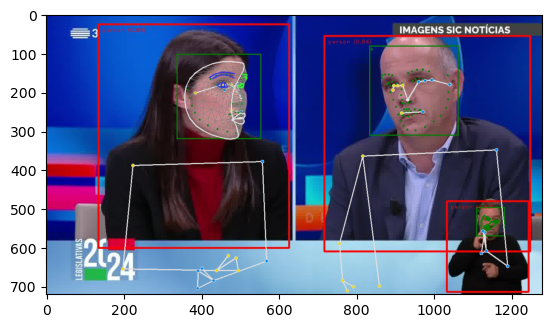

Debate cdu-ps:


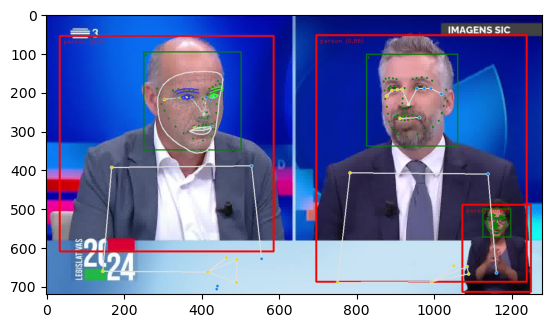

Debate chega-be:


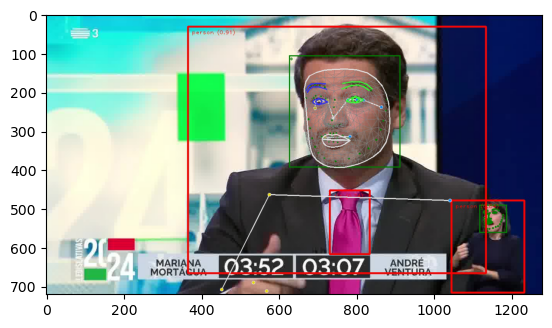

Debate chega-cdu:


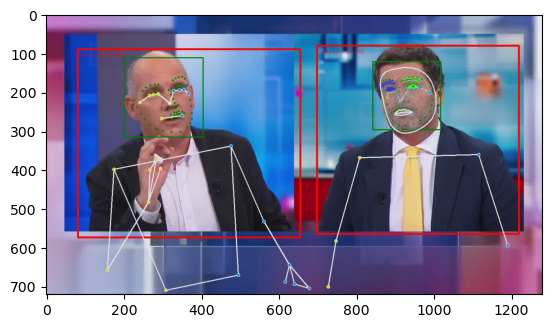

Debate chega-il:


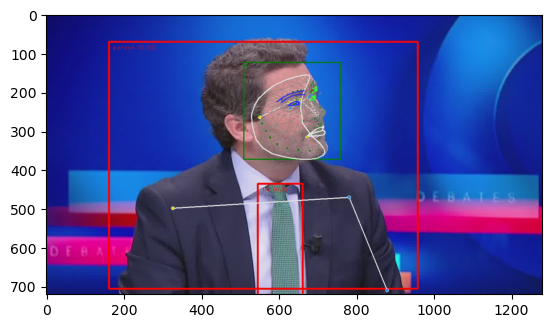

Debate chega-ps:


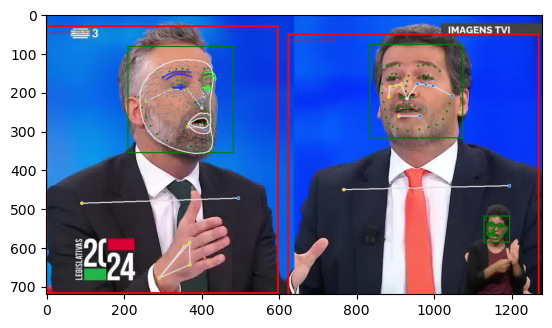

Debate il-be:


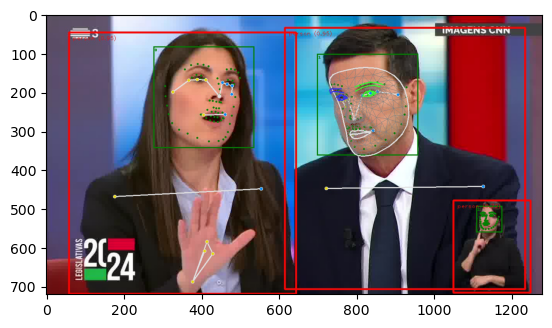

Debate il-cdu:


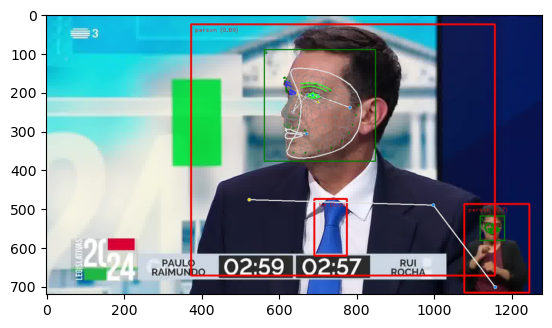

Debate il-ps:


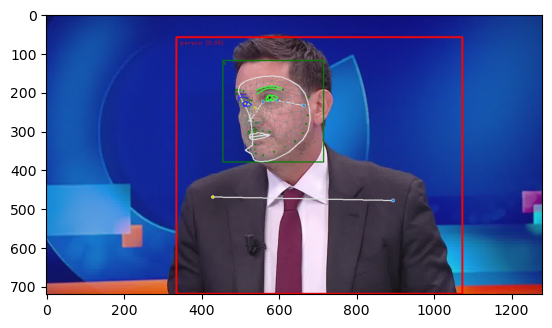

Debate livre-be:


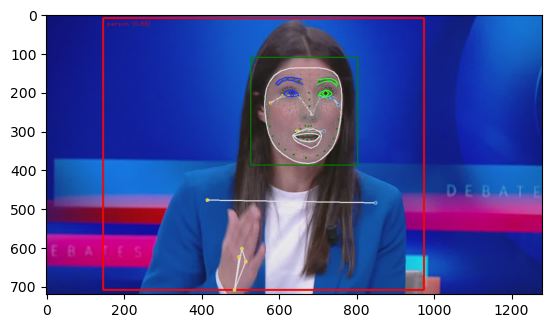

Debate livre-cdu:


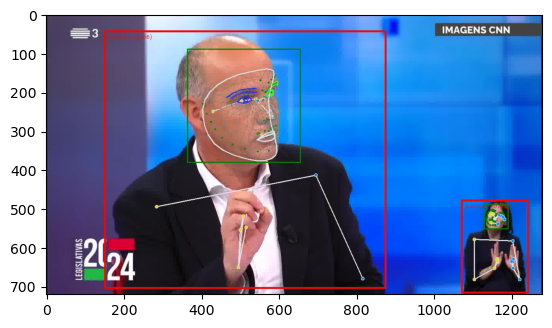

Debate livre-chega:


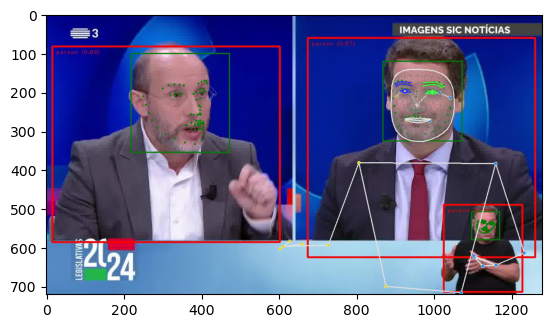

Debate livre-il:


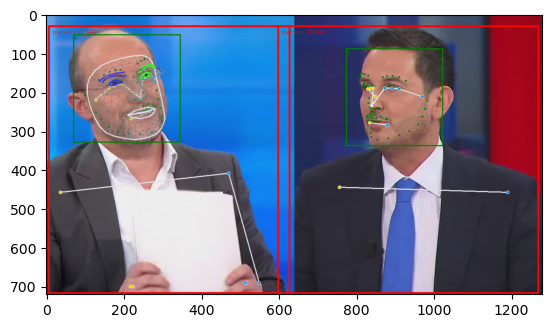

Debate livre-ps:


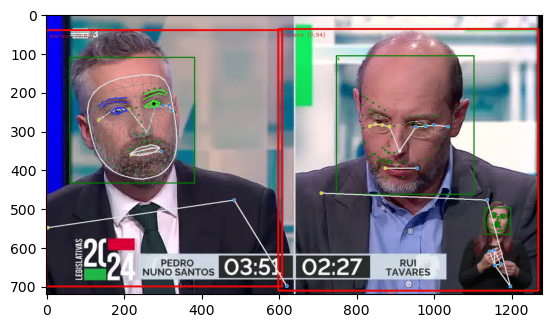

Debate pan-be:


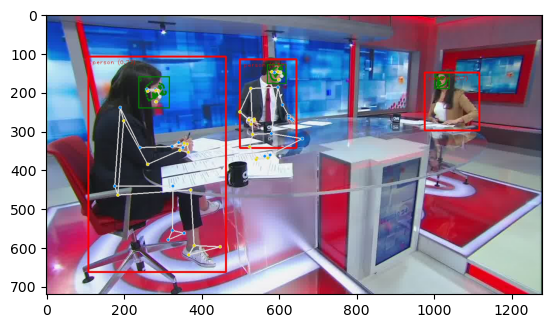

Debate pan-cdu:


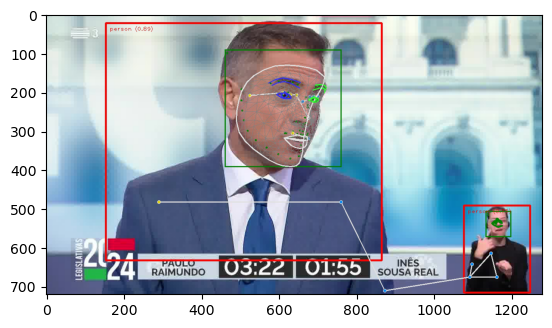

Debate pan-chega:


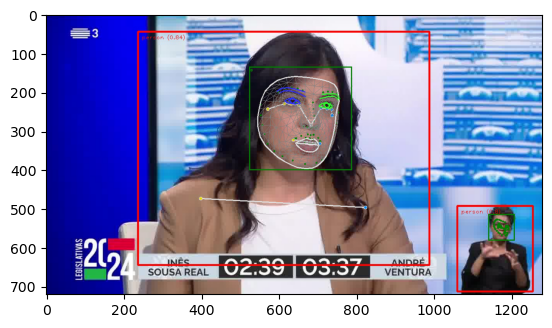

Debate pan-il:


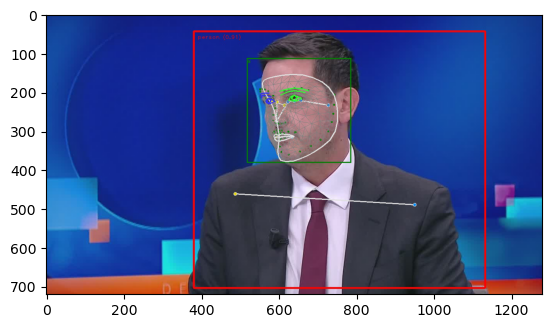

Debate pan-livre:


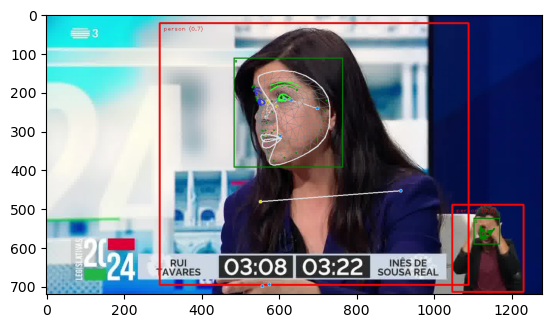

Debate pan-ps:


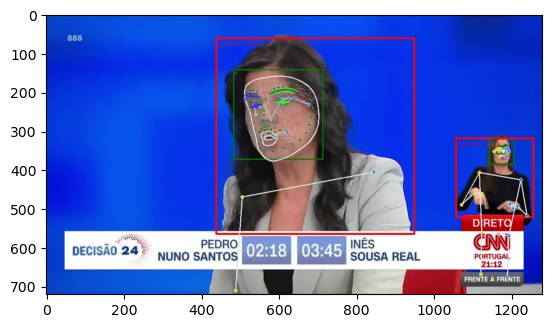

In [8]:
for key, df in dfs.items():
    print(f"Debate {key}:")
    view_frame(key, df, 500)

### We observe that in 9 debates there is no translator, in 18 debates there is one translator and in 1 debate there are two translators (ad-il).

<a id="section1"></a>

# 1. Determine all detected objects

In [ ]:
detected_objects = defaultdict(int)

for key, df in dfs.items():  
    for detections in df['detections']:
        for detection in detections:
            detected_objects[detection[4]]+=1
        
print(f"All detected objects: {list(detected_objects.keys())}")

In [ ]:
top10_obj = dict(sorted(detected_objects.items(), key=lambda item: item[1], reverse=True)[:10])

plt.figure(figsize=(10,6))
ax = sns.barplot(x=list(top10_obj.keys()), y=list(top10_obj.values()))
plt.xlabel('Object')
plt.ylabel('Count')
for i, value in enumerate(top10_obj.values()):
    ax.text(i, value + 0.3, str(value), ha='center', va='bottom')

plt.show()

<a id="section2"></a>

# 2. Determine all detected emotions

In [ ]:
detected_emotions = defaultdict(int)

for key, df in dfs.items():
    for observation in df['fer']:
        for fer_object in observation:
            detected_emotions[fer_object['emotion']]+=1
        
print(f"All detected emotions: {list(detected_emotions.keys())}")

In [ ]:
sorted_emotions = dict(sorted(detected_emotions.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10,6))
ax = sns.barplot(x=list(sorted_emotions.keys()), y=list(sorted_emotions.values()))
plt.xlabel('Emotion')
plt.ylabel('Count')

for i, value in enumerate(sorted_emotions.values()):
    ax.text(i, value + 0.3, str(value), ha='center', va='bottom')

plt.show()

<a id="section3"></a>

# 3. Person identification through different debates

In [ ]:
parties = ['ad', 'ps', 'chega', 'il', 'livre', 'be', 'cdu', 'pan']
print(f"The political parties are: {parties}")

### Select party:

In [ ]:
party = 'ad'

In [ ]:
dfs_party = defaultdict(pd.DataFrame)
for key, df in dfs.items():
    if party in key:
        dfs_party[key] = copy.deepcopy(df)

In [ ]:
dfs_party.keys()

<a id="section3.1"></a>

## 3.1 Compare the image embeddings between two videos for a selected party

<a id="section3.1.1"></a>

## 3.1.1 Using PCA

### We select 'ad-cdu' for example:

In [9]:
embeddings = [emb for emb in dfs['ad-cdu']['embedding']]
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

pca = PCA(n_components=1024, random_state = random_seed)
embeddings = pca.fit_transform(embeddings)

explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

optimal_components = np.argmax(explained_variance_ratio >= 0.90) + 1
print("Optimal number of components for 90% explained variance:", optimal_components)

pca = PCA(n_components=optimal_components, random_state = random_seed)
embeddings = pca.fit_transform(embeddings)

Optimal number of components for 90% explained variance: 393


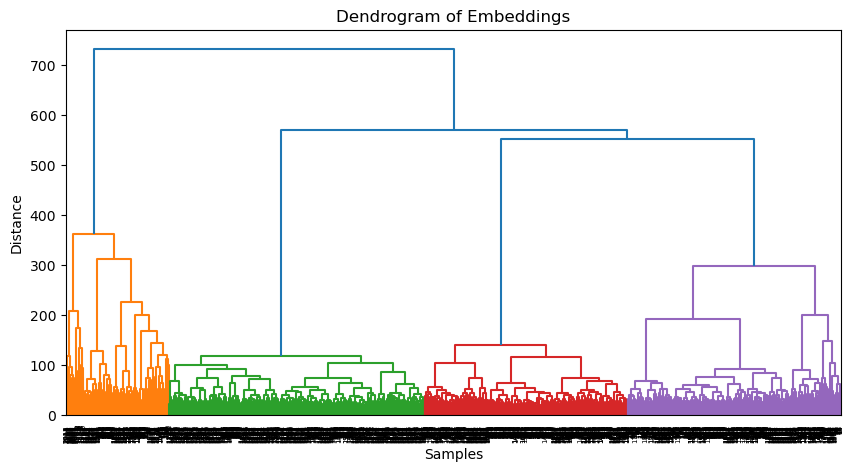

In [392]:
Z = linkage(embeddings, method='ward')

plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrogram of Embeddings')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

### The dendrogram tells us that for this video there are 4 clear clusters. We will do for 7:

C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


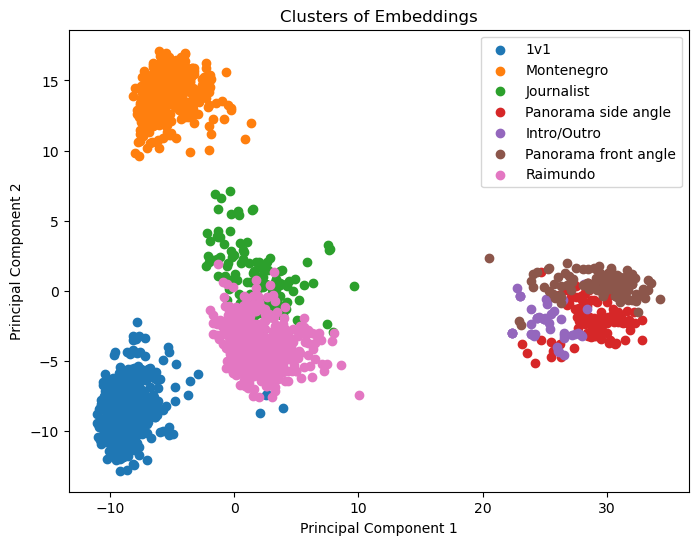

Cluster 1
[29, 30, 31, 32, 33, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281]


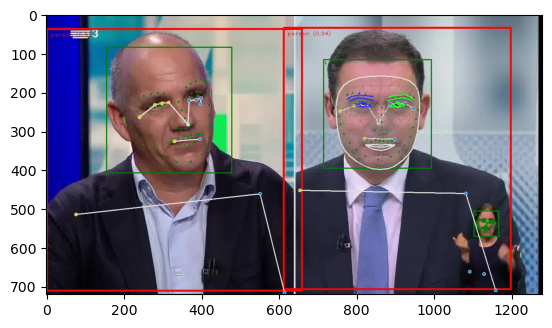

Cluster 2
[191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220]


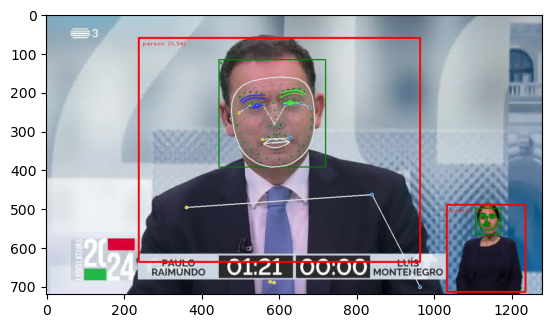

Cluster 3
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 39, 40, 41, 46, 47, 48, 49, 171, 172, 173, 174, 175, 181, 182]


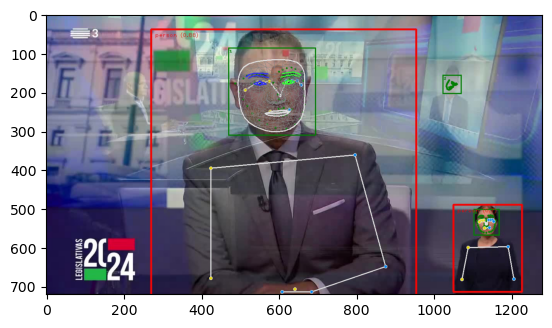

Cluster 4
[102, 103, 104, 160, 161, 185, 186, 187, 188, 189, 190, 254, 255, 256, 293, 294, 295, 341, 342, 343, 344, 461, 462, 463, 464, 465, 466, 517, 518, 527]


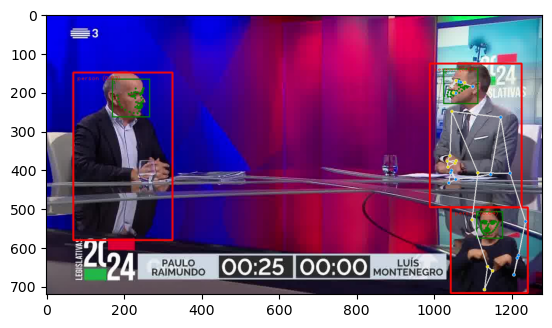

Cluster 5
[2, 3, 4, 5, 6, 7, 8, 9, 10, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001]


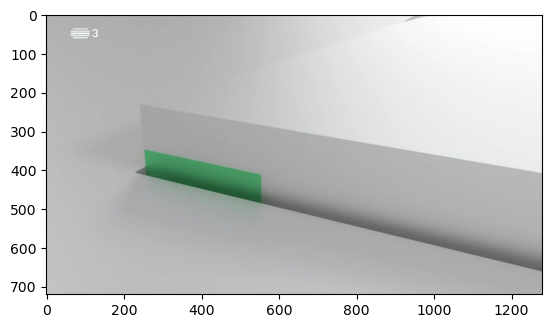

Cluster 6
[0, 1, 11, 12, 34, 35, 36, 37, 38, 50, 58, 59, 60, 61, 95, 96, 97, 98, 99, 167, 168, 169, 170, 176, 177, 178, 179, 180, 472, 473]


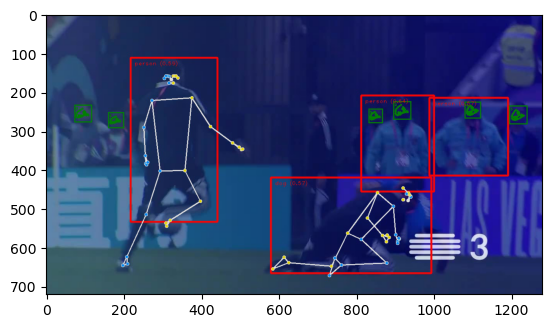

Cluster 7
[42, 43, 44, 45, 51, 52, 53, 54, 55, 56, 57, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


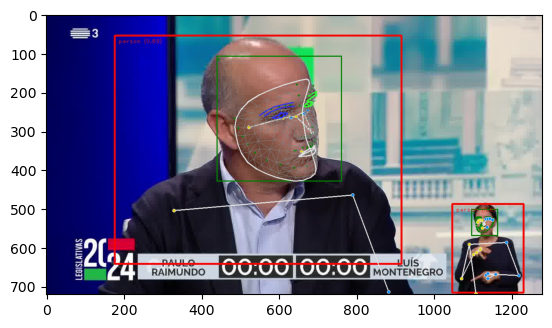

In [10]:
num_clusters = 7

kmeans = KMeans(n_clusters=num_clusters, random_state=random_seed,n_init=20).fit(embeddings)
labels_ad_cdu = cluster_labels = kmeans.labels_

# For visualization
pca = PCA(n_components=2, random_state=random_seed)
emb_ad_cdu = embeddings = pca.fit_transform(embeddings)

cluster_names = {
    0: '1v1',
    1: 'Montenegro',
    2: 'Journalist',
    3: 'Panorama side angle',
    4: 'Intro/Outro',
    5: 'Panorama front angle',
    6: 'Raimundo'
}


# Visualize Clusters
plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    plt.scatter(embeddings[cluster_labels == i, 0], embeddings[cluster_labels == i, 1], label=cluster_names[i])
plt.title('Clusters of Embeddings')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

C1 = [[] for _ in range(num_clusters)]

for index, label in enumerate(cluster_labels):
    C1[label].append(index)
    
for i in range(len(C1)):
    frame = C1[i][0]
    arr = C1[i][:30]
    print(f'Cluster {i+1}')
    print(arr)
    view_frame('ad-cdu', dfs['ad-cdu'], frame)

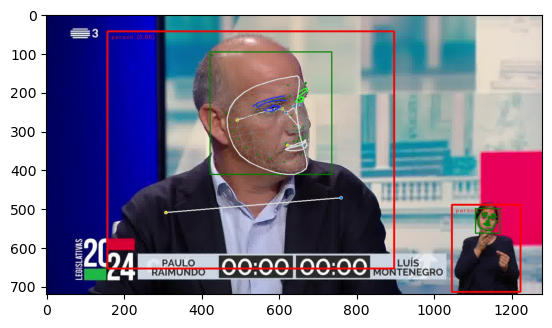

In [431]:
view_frame('ad-cdu', dfs['ad-cdu'], 51)

### We have the following scenes:
- Cluster 1: 1v1
- Cluster 2: Montenegro
- Cluster 3: Journalist
- Cluster 4: Panorama side angle
- Cluster 5: Intro/Outro 
- Cluster 6: Panorama front angle
- Cluster 7: Paulo Raimundo

### Due to the drastic scene changes, in this video we can only separate the scenes with 7 clusters. If we did less than that, then the Paulo Raimundo and Journalist clusters wouldn't be separable.

## Let's quickly look at another video for comparison

### We select 'ad-be' for example:

Optimal number of components for 90% explained variance: 396


C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


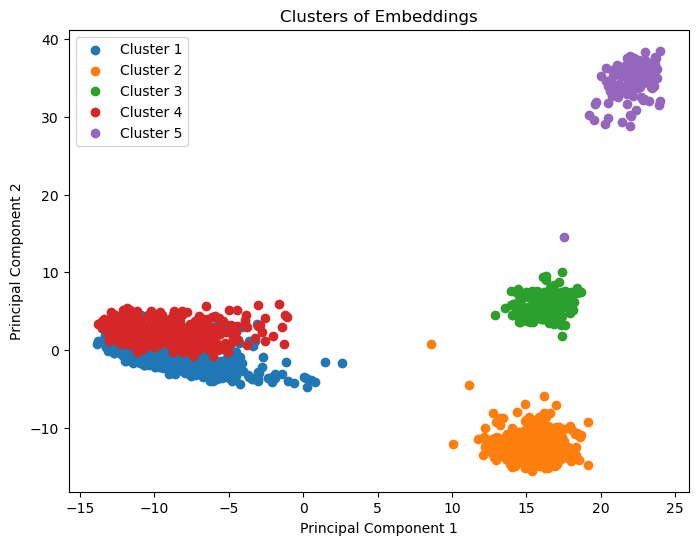

In [396]:
embeddings = [emb for emb in dfs['ad-be']['embedding']]
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

pca = PCA(n_components=1024, random_state=random_seed)
embeddings = pca.fit_transform(embeddings)

explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

optimal_components = np.argmax(explained_variance_ratio >= 0.90) + 1
print("Optimal number of components for 90% explained variance:", optimal_components)

pca = PCA(n_components=optimal_components, random_state=random_seed)
data = pca.fit_transform(embeddings)

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state=random_seed,n_init=20).fit(embeddings)

pca = PCA(n_components=2, random_state=random_seed)
emb_ad_be = embeddings = pca.fit_transform(embeddings)

labels_ad_be = cluster_labels = kmeans.labels_

# Visualize Clusters
plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    plt.scatter(embeddings[cluster_labels == i, 0], embeddings[cluster_labels == i, 1], label=f'Cluster {i+1}')
plt.title('Clusters of Embeddings')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

Cluster 1
[168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363]


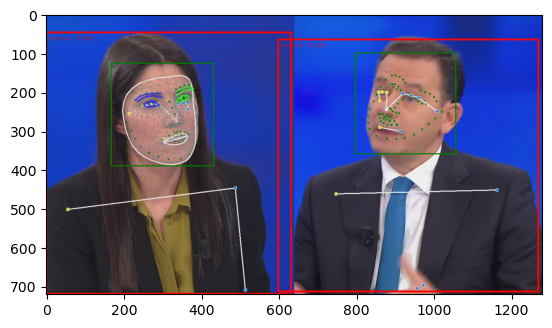

Cluster 2
[13, 28, 29, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 89, 90]


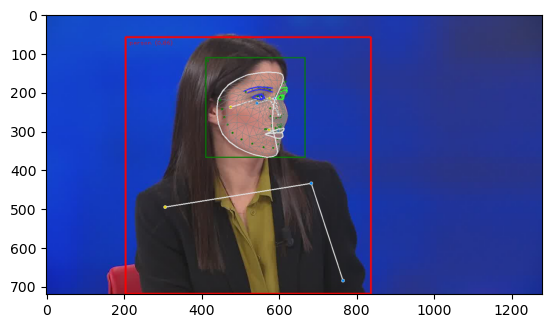

Cluster 3
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 17, 18, 19, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]


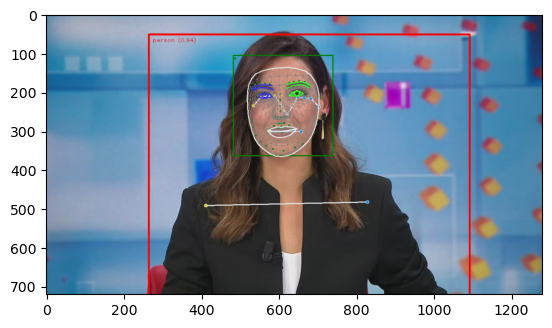

Cluster 4
[14, 15, 16, 62, 63, 114, 134, 135, 136, 140, 141, 142, 143, 144, 145, 146, 147, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162]


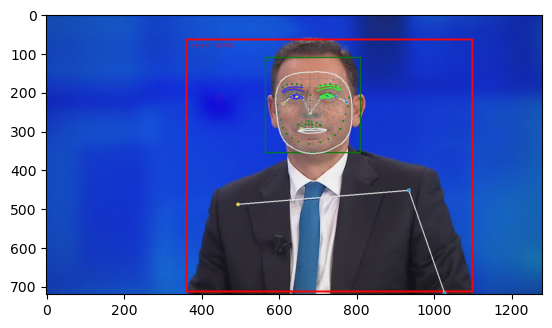

Cluster 5
[20, 21, 22, 23, 24, 25, 26, 27, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 260, 261, 262, 263, 300, 301, 302, 303, 423, 424, 425, 426]


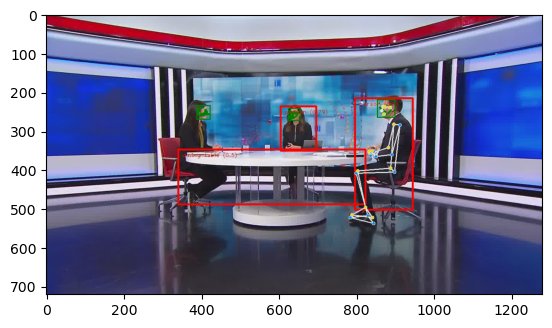

In [397]:
C2 = [[] for _ in range(num_clusters)]

for index, label in enumerate(cluster_labels):
    C2[label].append(index)
    
for i in range(len(C2)):
    frame = C2[i][0]
    arr = C2[i][:30]
    print(f'Cluster {i+1}')
    print(arr)
    view_frame('ad-be', dfs['ad-be'], frame)

### Visualize the the clusters of both debates

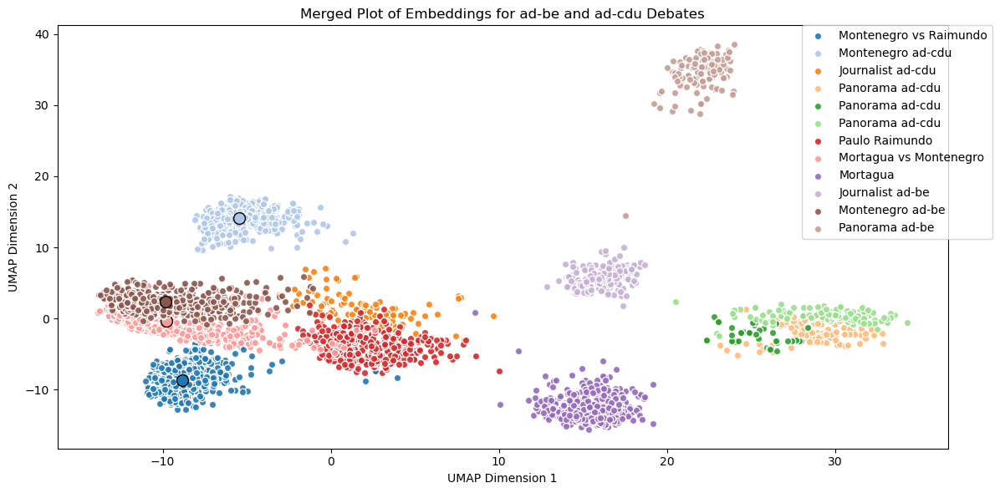

In [398]:
combined_embeddings = np.vstack((emb_ad_cdu, emb_ad_be))
labels_ad_be = cluster_labels
labels_ad_be = labels_ad_be + 7
combined_labels = np.concatenate((labels_ad_cdu, labels_ad_be))

# Define cluster names
cluster_names = {
    0: 'Montenegro vs Raimundo',
    1: 'Montenegro ad-cdu',
    2: 'Journalist ad-cdu',
    3: 'Panorama ad-cdu',
    4: 'Panorama ad-cdu',
    5: 'Panorama ad-cdu',
    6: 'Paulo Raimundo',
    7: 'Mortagua vs Montenegro',
    8: 'Mortagua',
    9: 'Journalist ad-be',
    10: 'Montenegro ad-be',
    11: 'Panorama ad-be'
}

# stores the centroids
centroids = defaultdict(list)

plt.figure(figsize=(12, 6))
unique_labels = np.unique(combined_labels)

# Use a colormap with more distinct colors
colors = plt.get_cmap('tab20').colors

for label in unique_labels:
    indices = np.where(combined_labels == label)
    cluster_name = cluster_names.get(label, f'Cluster {label}')
    color = colors[label % len(colors)]  # Cycle through colors if there are more labels than colors

    plt.scatter(combined_embeddings[indices, 0], combined_embeddings[indices, 1], 
                color=color, label=cluster_name, alpha=0.9, edgecolor='w')
    
    centroid_x = np.mean(combined_embeddings[indices, 0])
    centroid_y = np.mean(combined_embeddings[indices, 1])
    centroids[cluster_names[label]] = np.array([centroid_x, centroid_y])
    
    if 'Montenegro' in cluster_name:
        plt.scatter(centroid_x, centroid_y, color=color, marker='o', s=100, edgecolor='black')

plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Merged Plot of Embeddings for ad-be and ad-cdu Debates')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.tight_layout()
plt.show()

In [399]:
distance_MM = np.sqrt(np.sum((centroids['Montenegro ad-cdu'] - centroids['Montenegro ad-be'])**2))
distance_MJ = np.sqrt(np.sum((centroids['Montenegro ad-cdu'] - centroids['Journalist ad-cdu'])**2))

print(f'Distance between Montenegro clusters = {distance_MM} \n'
      f'Distance between Montenegro ad-cdu and Journalist ad-cdu = {distance_MJ}')

Distance between Montenegro clusters = 12.474871193029612 
Distance between Montenegro ad-cdu and Journalist ad-cdu = 15.000701887127404


### By visualizing this plot, we can make the following observations:
- The centroids for the Montenegro clusters are closer to each other, but the distance between Montenegro ad-cdu and Journalist ad-cdu is relatively close compared to the Montenegro clusters.
- Panorama or advertisement scenes are very separable.
- 1v1 scenes are unpredictable.
- Single person scenes are mostly separable.

### Thus, we make the following conclusions:
- Image embeddings alone are not sufficient for person identification in scenes other than single person.
- It may be possible to do face identification for single face scenes using image embeddings.

### We previously saw that the number of optimal clusters is dependent on how drastic the scene changes are, i.e, the camera angles. This may be related to the TV broadcaster or certain debates in concrete. 
### Thus, the most realistic way to do face identification is to use only the dataset including the front camera view angles, i.e, the frames where only one person, excluding the translator, is visible.

<a id="section3.1.2"></a>

## 3.1.2 Alternative to PCA: Clustering with UMAP

### Since we want a metric based on the euclidean distance, it's more obvious to visualize the intrinsic local structure of the data if we do manifold approximation instead of PCA. However, since UMAP is susceptible to destroying the data, let's first observe how successful it is at doing scene segmentation.

### We intend to observe the local structure of the image embeddings.

In [13]:
embeddings = [emb for emb in dfs['ad-cdu']['embedding']]
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)
umap = UMAP(n_components=2, random_state=random_seed)
embeddings_umap = umap.fit_transform(embeddings)

In [14]:
# select clustering algorithm (After testing, the best results are obtained for K-Means)
algo=0

In [15]:
num_clusters = 7
if algo==0:

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=random_seed, n_init=20).fit(embeddings_umap)
    cluster_labels = kmeans.labels_

elif algo==1:
    # Perform Gaussian Mixture Model (GMM) clustering
    gmm = GaussianMixture(n_components=num_clusters, random_state=0)
    cluster_labels = gmm.fit_predict(embeddings_umap)

elif algo==2:
    # Perform Spectral Clustering
    spectral = SpectralClustering(n_clusters=num_clusters, affinity='nearest_neighbors', random_state=0)
    cluster_labels = spectral.fit_predict(embeddings_umap)

else:
    raise Exception('Must select a clustering algorithm.')

C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


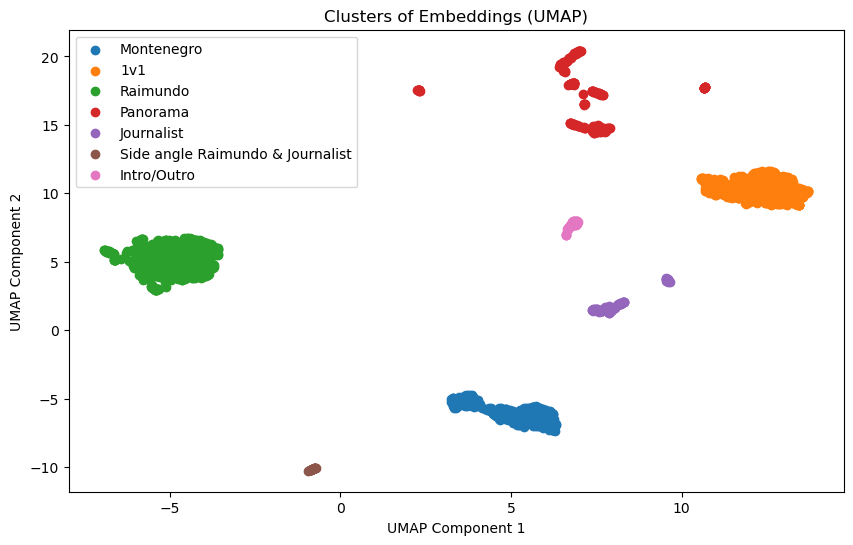

Cluster 1
[0, 1, 42, 43, 44, 45, 51, 52, 53, 54, 55, 56, 57, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]


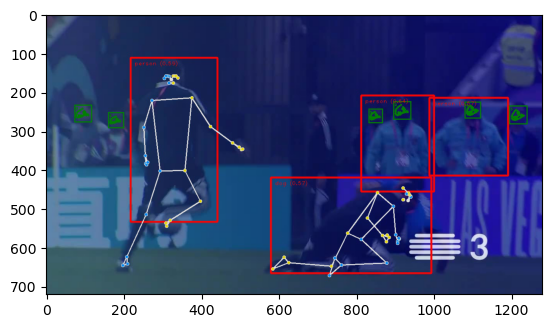

Cluster 2
[191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220]


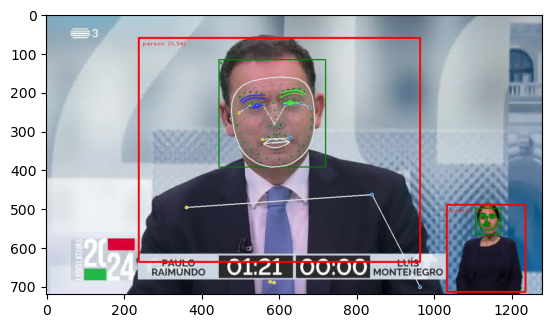

Cluster 3
[29, 30, 31, 32, 33, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281]


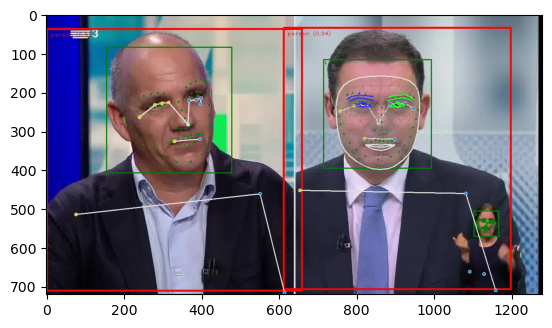

Cluster 4
[11, 12, 34, 35, 36, 37, 38, 58, 59, 60, 61, 95, 96, 97, 98, 99, 102, 103, 104, 160, 161, 167, 168, 169, 170, 176, 177, 178, 179, 180]


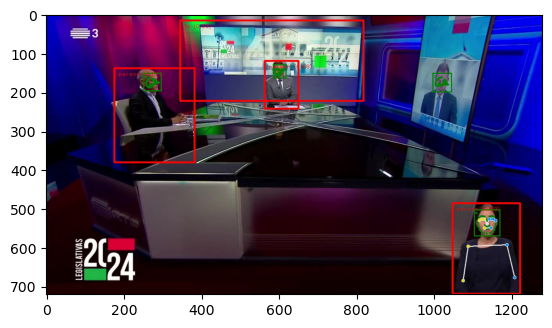

Cluster 5
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 39, 40, 41, 171, 172, 173, 174, 175, 181, 182, 183, 184, 345, 346]


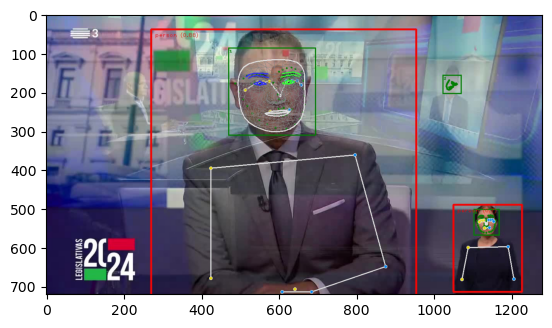

Cluster 6
[46, 47, 48, 49, 50, 478, 479, 480, 485, 486, 487, 604, 1261, 1262, 1263, 1505, 1506, 1507, 1508, 1771, 1772]


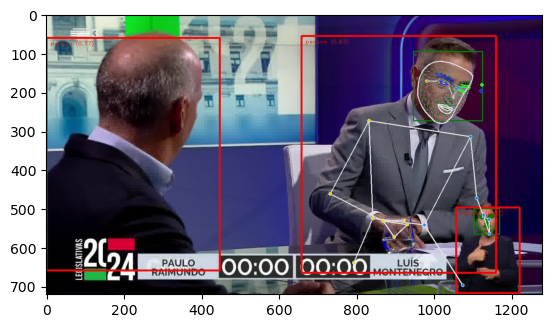

Cluster 7
[2, 3, 4, 5, 6, 7, 8, 9, 10, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001]


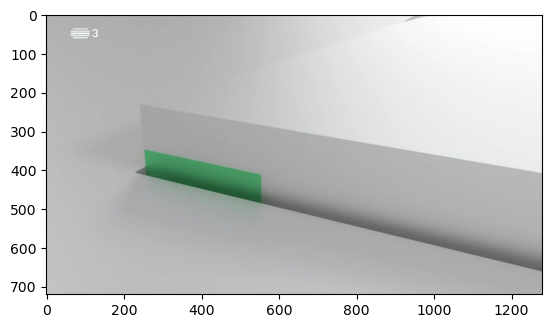

In [33]:
cluster_names = {
    0: 'Montenegro',
    1: '1v1',
    2: 'Raimundo',
    3: 'Panorama',
    4: 'Journalist',
    5: 'Side angle Raimundo & Journalist',
    6: 'Intro/Outro'
}

plt.figure(figsize=(10, 6))
for i in range(num_clusters):
    cluster_points = embeddings_umap[cluster_labels == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=cluster_names[i])

plt.title('Clusters of Embeddings (UMAP)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.legend(loc='best')
plt.show()

C1 = [[] for _ in range(num_clusters)]
for index, label in enumerate(cluster_labels):
    C1[label].append(index)

for i in range(len(C1)):
    frame = C1[i][0]
    arr = C1[i][:30]
    print(f'Cluster {i+1}')
    print(arr)
    view_frame('ad-cdu', dfs['ad-cdu'], frame)

### We have the following scenes:
- Cluster 1: Montenegro
- Cluster 2: 1v1
- Cluster 3: Paulo Raimundo
- Cluster 4: Panorama
- Cluster 5: Journalist 
- Cluster 6: Side angle Raimundo & Journalist
- Cluster 7: Intro/Outro

### By comparing the frames attributed to each cluster, we conclude that the difference between the PCA model and the UMAP model is marginal. However, UMAP is slightly better at distinguishing between single face frames and panorama frames when the camera angle is a little ambiguous. 

### Furthermore, the intrinsic structure of the clusters provided by UMAP will be more useful in developing a metric for person identification than the centroids of the PCA model.

### For these reasons, we will adopt the model with UMAP and K-Means using image embeddings for scene segmentation.

<a id="section3.2"></a>

## 3.2 Compare image embeddings between a party's videos using only single person scenes

In [460]:
# Check the number of detected persons for each debate
debate_counts = defaultdict()
for key, df in dfs_party.items():
    print(f'debate {key}')
    num = df['fer'].apply(len).min()
    print(f'Minimum number of detected faces is {num}')
    counts = defaultdict(int)
    for length in df['fer'].apply(len):
        counts[length] += 1
    counts = dict(sorted(counts.items()))
    print(counts)
    debate_counts[key] = counts


debate ad-be
Minimum number of detected faces is 1
{1: 1190, 2: 748, 3: 121, 4: 1}
debate ad-cdu
Minimum number of detected faces is 0
{0: 45, 2: 1066, 3: 723, 4: 175, 5: 6, 6: 1, 7: 1}
debate ad-chega
Minimum number of detected faces is 0
{0: 7, 1: 23, 2: 1078, 3: 1067, 4: 154, 5: 37, 6: 1}
debate ad-il
Minimum number of detected faces is 0
{0: 9, 2: 8, 3: 1020, 4: 646, 5: 223, 6: 1}
debate ad-livre
Minimum number of detected faces is 0
{0: 14, 1: 3, 2: 1385, 3: 271, 4: 164}
debate ad-pan
Minimum number of detected faces is 1
{1: 828, 2: 786, 3: 271, 4: 2}
debate ad-ps
Minimum number of detected faces is 0
{0: 45, 1: 21, 2: 3720, 3: 1006, 4: 105, 5: 40, 6: 4}


In [461]:
# Determine the number of persons in single person scenes accounting for the translators
min_counts = defaultdict(int)
for key, dic in debate_counts.items():
    val = 0
    for n, val in dic.items():
        if val>400: # arbitrary threshold
            min_counts[key] = n
            break
min_counts

defaultdict(int,
            {'ad-be': 1,
             'ad-cdu': 2,
             'ad-chega': 2,
             'ad-il': 3,
             'ad-livre': 2,
             'ad-pan': 1,
             'ad-ps': 2})

In [462]:
# Trim the dataset to only single person scenes
new_df = copy.deepcopy(dfs_party)
for key, df in new_df.items():
    new_df[key] = df[df['fer'].apply(len) == min_counts[key]]
    
for key, df in new_df.items():
    print(f'debate: {key}, number of frames: {len(df)}')

debate: ad-be, number of frames: 1190
debate: ad-cdu, number of frames: 1066
debate: ad-chega, number of frames: 1078
debate: ad-il, number of frames: 1020
debate: ad-livre, number of frames: 1385
debate: ad-pan, number of frames: 828
debate: ad-ps, number of frames: 3720


ad-be


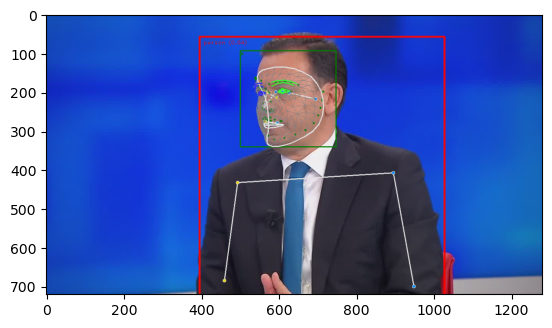

ad-cdu


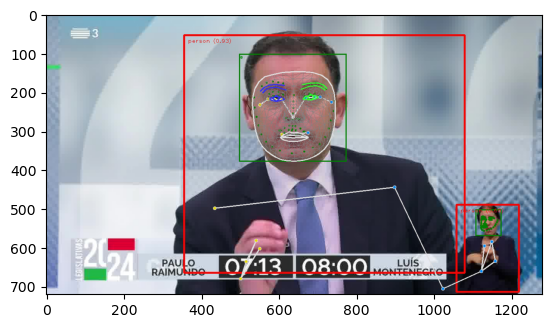

ad-chega


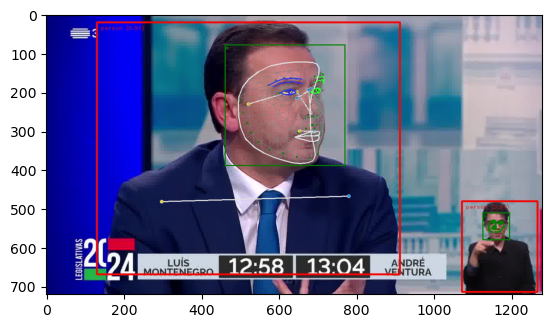

ad-il


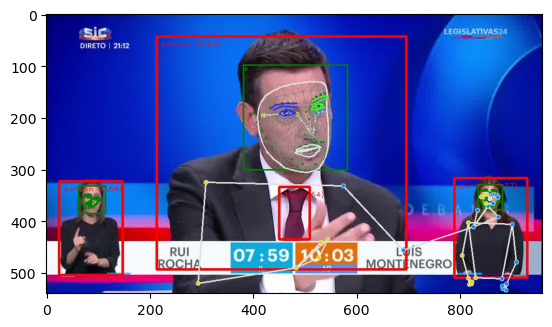

ad-livre


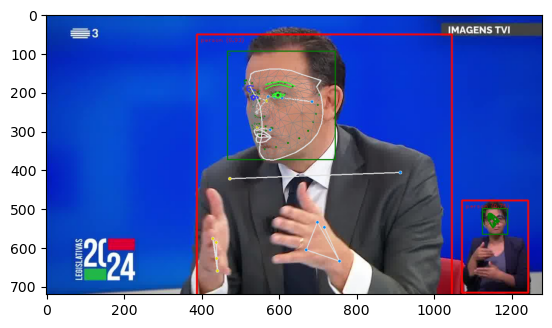

ad-pan


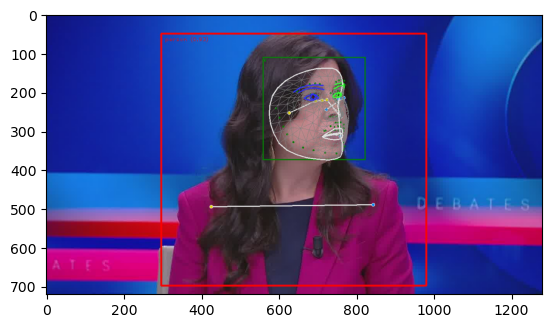

ad-ps


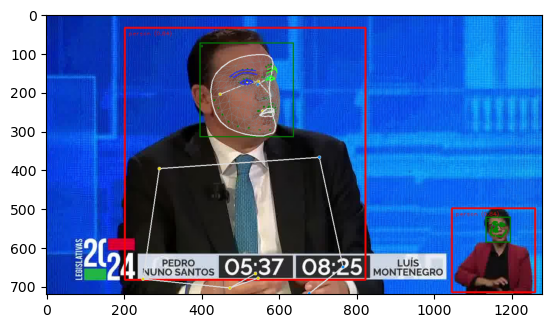

In [463]:
for key, df in new_df.items():
    print(key)
    view_frame(key, new_df[key], 700)

In [475]:
emb = defaultdict(list)
emb_labels = defaultdict(int)
emb_centroids = []

for key, df in new_df.items():
    embeddings = df['embedding'].tolist()  # Assuming 'embedding' is a column of embeddings

    scaler = StandardScaler()
    embeddings_scaled = scaler.fit_transform(embeddings)

    umap = UMAP(n_components=2, random_state=random_seed)
    embeddings_umap = umap.fit_transform(embeddings_scaled)

    num_clusters = 3
    kmeans = KMeans(n_clusters=num_clusters, random_state=random_seed, n_init=20)
    cluster_labels = kmeans.fit_predict(embeddings_umap)

    emb_labels[key] = cluster_labels
    emb_centroids.extend(kmeans.cluster_centers_)

    emb[key] = embeddings_umap
    
rep = 0
for key, labels in emb_labels.items():
    emb_labels[key] += 3*rep
    rep += 1
    
# Create a combined DataFrame
data = []
for key in new_df.keys():
    embeddings = emb[key]
    labels = emb_labels[key]
    for i in range(len(embeddings)):
        data.append([embeddings[i][0], embeddings[i][1], key, labels[i], new_df[key].index[i]])

df_merged = pd.DataFrame(data, columns=['UMAP1', 'UMAP2', 'Debate', 'Cluster', 'Frame'])

C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\visio\anaconda3\envs\ML\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known

Debate ad-be, Cluster 0
Frame 57


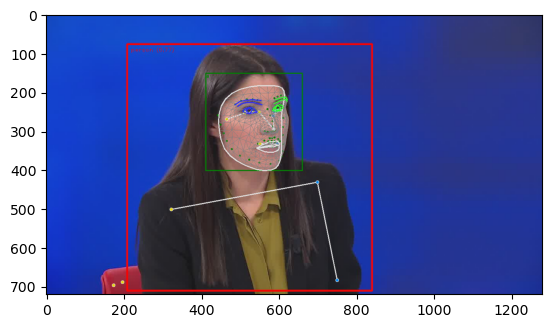

Debate ad-be, Cluster 1
Frame 141


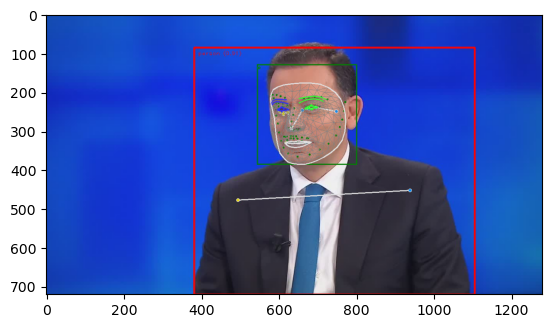

Debate ad-be, Cluster 2
Frame 10


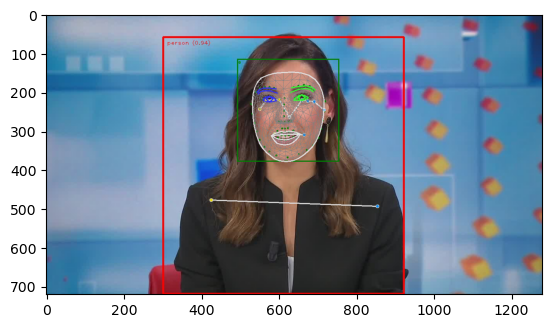

Debate ad-cdu, Cluster 3
Frame 201


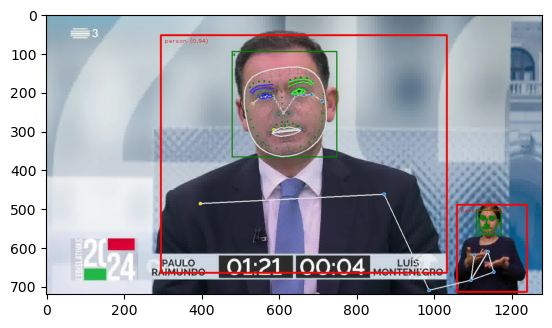

Debate ad-cdu, Cluster 4
Frame 57


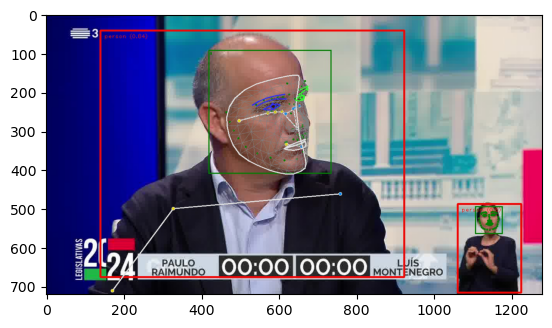

Debate ad-cdu, Cluster 5
Frame 24


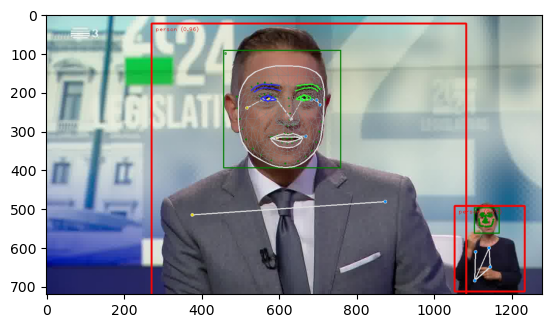

Debate ad-chega, Cluster 6
Frame 233


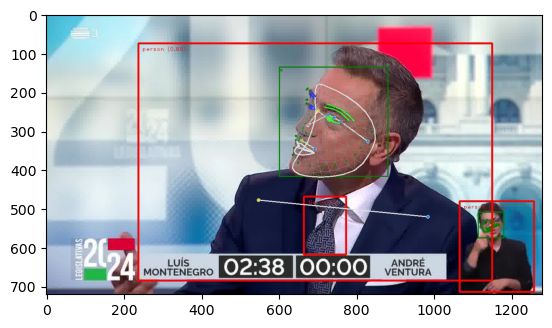

Debate ad-chega, Cluster 7
Frame 281


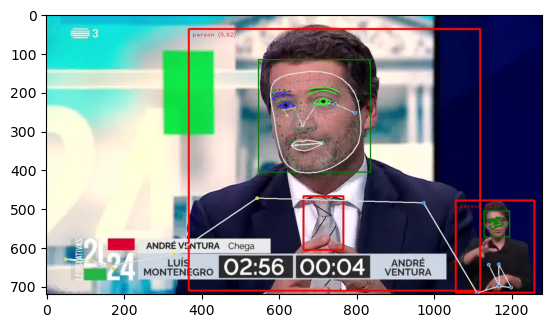

Debate ad-chega, Cluster 8
Frame 61


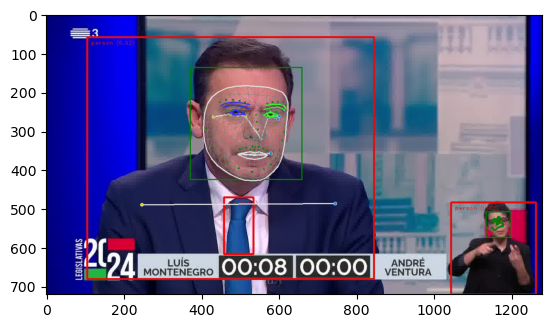

Debate ad-il, Cluster 9
Frame 196


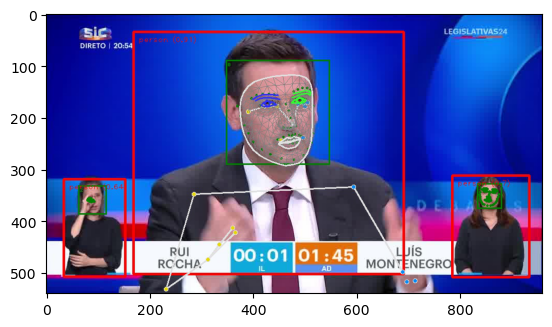

Debate ad-il, Cluster 10
Frame 57


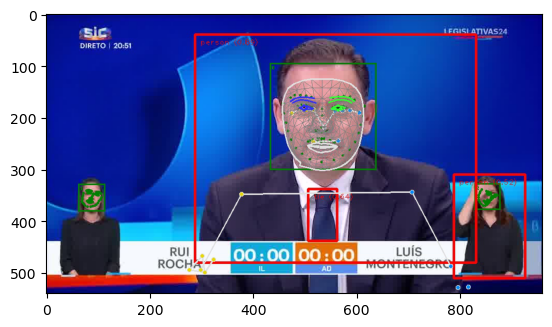

Debate ad-il, Cluster 11
Frame 19


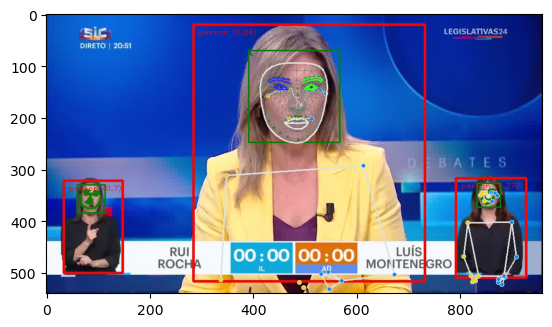

Debate ad-livre, Cluster 12
Frame 206


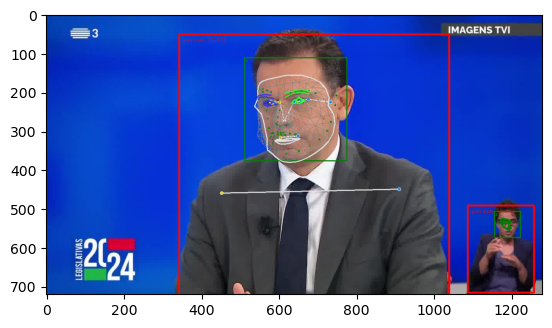

Debate ad-livre, Cluster 13
Frame 65


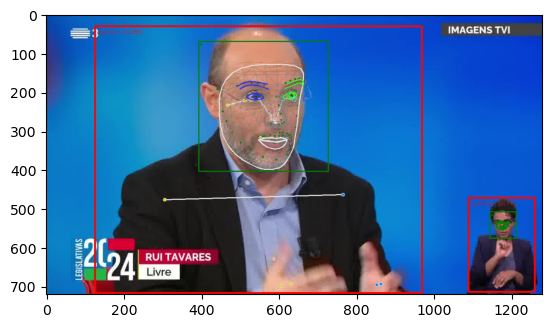

Debate ad-livre, Cluster 14
Frame 25


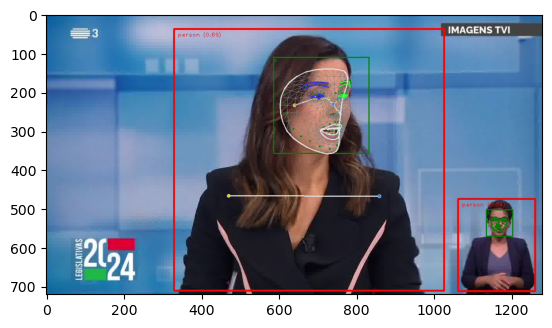

Debate ad-pan, Cluster 15
Frame 33


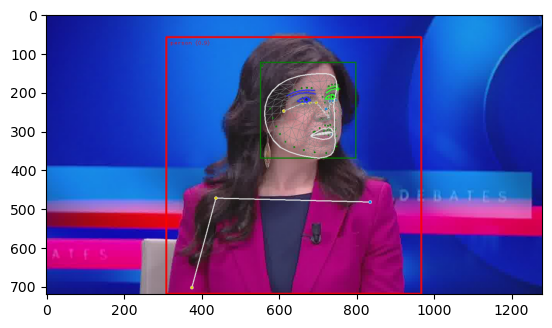

Debate ad-pan, Cluster 16
Frame 136


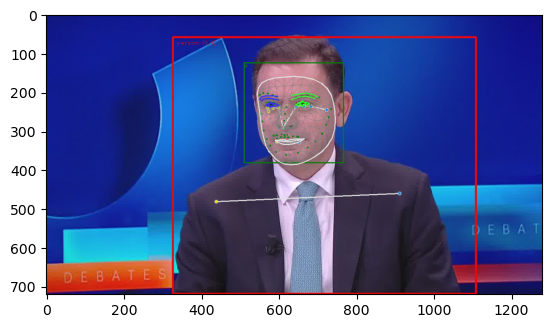

Debate ad-pan, Cluster 17
Frame 15


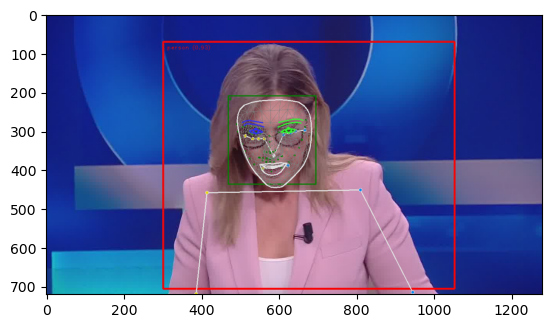

Debate ad-ps, Cluster 18
Frame 68


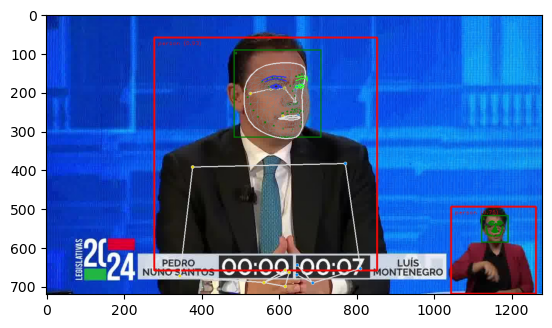

Debate ad-ps, Cluster 19
Frame 99


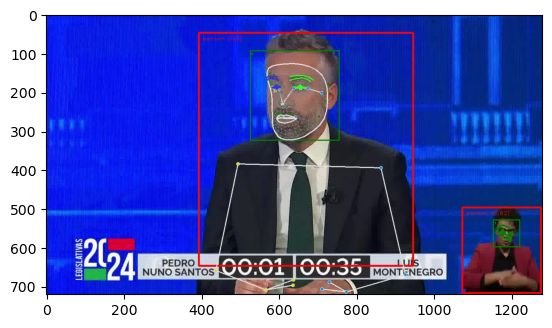

Debate ad-ps, Cluster 20
Frame 45


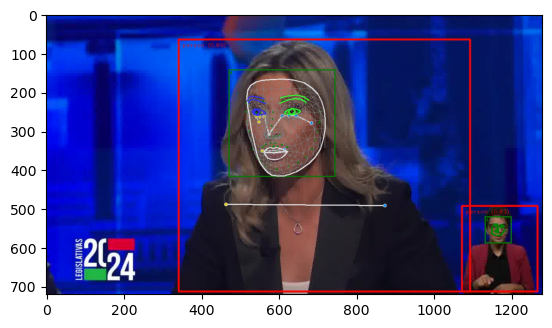

In [476]:
n = df_merged['Cluster'].nunique()

for i in range(n):
    obs = df_merged[df_merged['Cluster']==i]
    obs = obs.iloc[10]
    frame = obs['Frame']
    debate = obs['Debate']
    print(f'Debate {debate}, Cluster {i}')
    print(f'Frame {frame}')
    view_frame(debate, dfs[debate], frame)

C:\Users\visio\AppData\Local\Temp\ipykernel_936\1819553825.py:20: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\1819553825.py:20: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\1819553825.py:20: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.sca

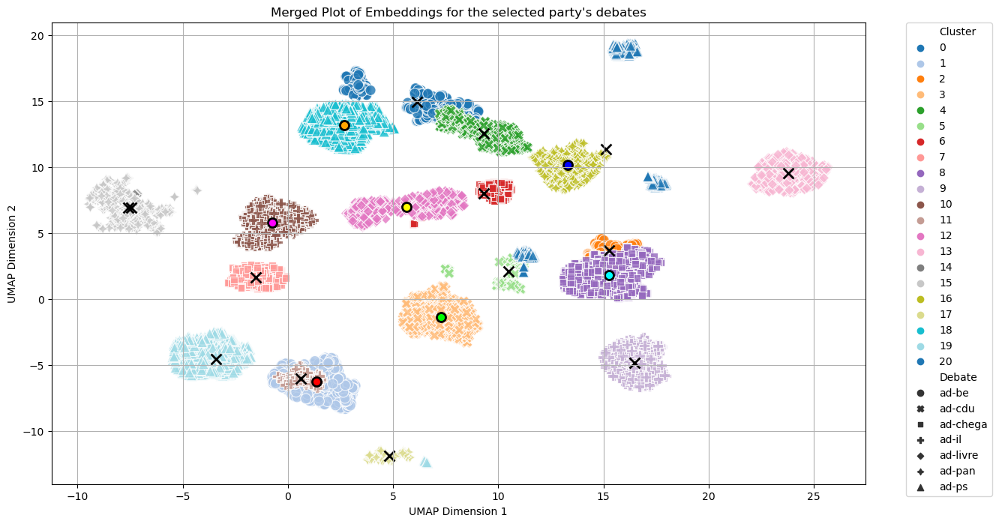

In [477]:
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_merged, x='UMAP1', y='UMAP2', hue='Cluster', style='Debate', palette='tab20', s=100, alpha=0.8)

color_map = {
    1: 'red', # ad-be
    3: 'lime', # ad-cdu
    8: 'cyan', # ad-chega
    10: 'magenta', # ad-il
    12: 'yellow', # ad-livre
    16: 'blue', # ad-pan
    18: 'orange' # ad-ps
}
centroids = {}
for cluster in df_merged['Cluster'].unique():
    centroid = df_merged[df_merged['Cluster'] == cluster][['UMAP1', 'UMAP2']].mean().values
    centroids[cluster] = centroid
    if cluster in color_map: # Hardcoded: Montenegro clusters
        plt.scatter(centroid[0], centroid[1], marker='o', color=color_map[cluster], s=75,linewidths=2, edgecolor='black')
    else:
        plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
plt.title("Merged Plot of Embeddings for the selected party's debates")
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.show()

### The colored centroids corresponded to Montenegro, the selected party.

### To simplify visualization, let's remove the moderator from the plot.

### Check the cluster ids:

In [478]:
mod_ids = {2, 5, 6, 11, 14, 17, 20}

C:\Users\visio\AppData\Local\Temp\ipykernel_936\86563219.py:22: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\86563219.py:22: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\86563219.py:22: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(c

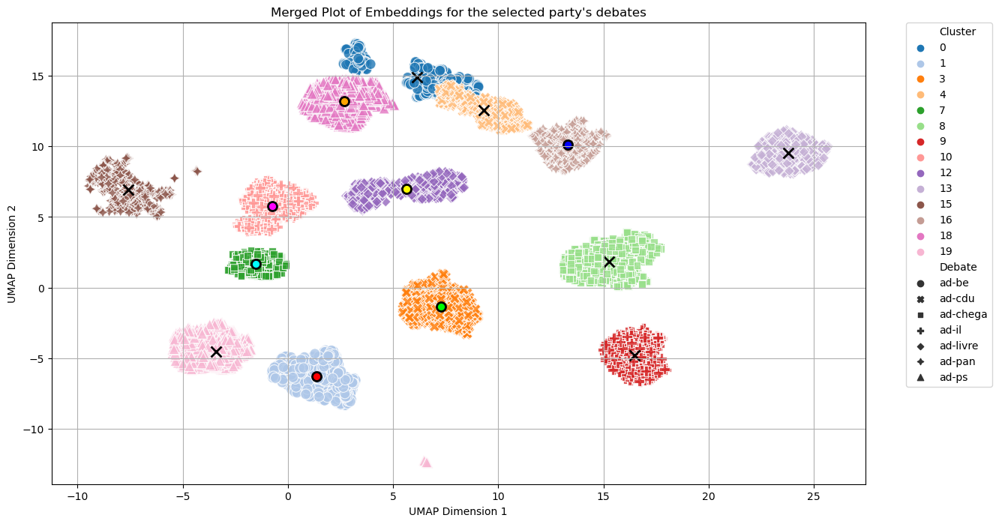

In [489]:
df_cut = df_merged[~df_merged['Cluster'].isin(mod_ids)]

plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_cut, x='UMAP1', y='UMAP2', hue='Cluster', style='Debate', palette='tab20', s=100, alpha=0.8)

color_map = {
    1: 'red', # ad-be
    3: 'lime', # ad-cdu
    7: 'cyan', # ad-chega
    10: 'magenta', # ad-il
    12: 'yellow', # ad-livre
    16: 'blue', # ad-pan
    18: 'orange' # ad-ps
}
centroids = {}
for cluster in df_cut['Cluster'].unique():
    centroid = df_cut[df_cut['Cluster'] == cluster][['UMAP1', 'UMAP2']].mean().values
    centroids[cluster] = centroid
    if cluster in color_map: # Hardcoded: Montenegro clusters
        plt.scatter(centroid[0], centroid[1], marker='o', color=color_map[cluster], s=75,linewidths=2, edgecolor='black')
    else:
        plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
plt.title("Merged Plot of Embeddings for the selected party's debates")
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.show()

### We observe that the clusters belonging to Montenegro are not linearly separable from the other clusters. Thus, we conclude that the image embeddings alone are not sufficient for person identification.

### We will next see if integrating information of the face embeddings is beneficial to this task.

<a id="section3.3"></a>

## 3.3 Visualize image and face embeddings relationship

### Hypothesis: The face embeddings belonging to the same person are closer in space

### We remove the translator's face embeddings for simplicity:

In [278]:
face_df = copy.deepcopy(new_df)

# Remove the face embedding of the translator
for key, df in face_df.items():
    for index in df.index:
        row = df.loc[index]
        fers = row['fer']
        if len(fers) > 1:
            # get only the face embedding with the largest height (also the one with the largest box)
            box_size = []
            for fer in fers:
                y1 = fer['location'][2]
                box_size.append(y1)
            desired_face = box_size.index(max(box_size))
            df.at[index, 'fer'] = [row['fer'][desired_face]]

### Visualization of the face embeddings distribution

In [498]:
data = []

for key, df in face_df.items():
    embeddings = [emb[0]['embedding'] for emb in df['fer']]
    scaler = StandardScaler()
    embeddings = scaler.fit_transform(embeddings)
    
    # Replace PCA with UMAP
    umap = UMAP(n_components=2, random_state=random_seed)
    embeddings = umap.fit_transform(embeddings)
    
    labels = emb_labels[key]
    for i in range(len(embeddings)):
        data.append([embeddings[i][0], embeddings[i][1], key, labels[i], face_df[key].index[i]])

df_face_merged = pd.DataFrame(data, columns=['UMAP1', 'UMAP2', 'Debate', 'Image Cluster', 'Frame'])

C:\Users\visio\AppData\Local\Temp\ipykernel_936\1731214828.py:21: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\1731214828.py:21: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')
C:\Users\visio\AppData\Local\Temp\ipykernel_936\1731214828.py:21: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.sca

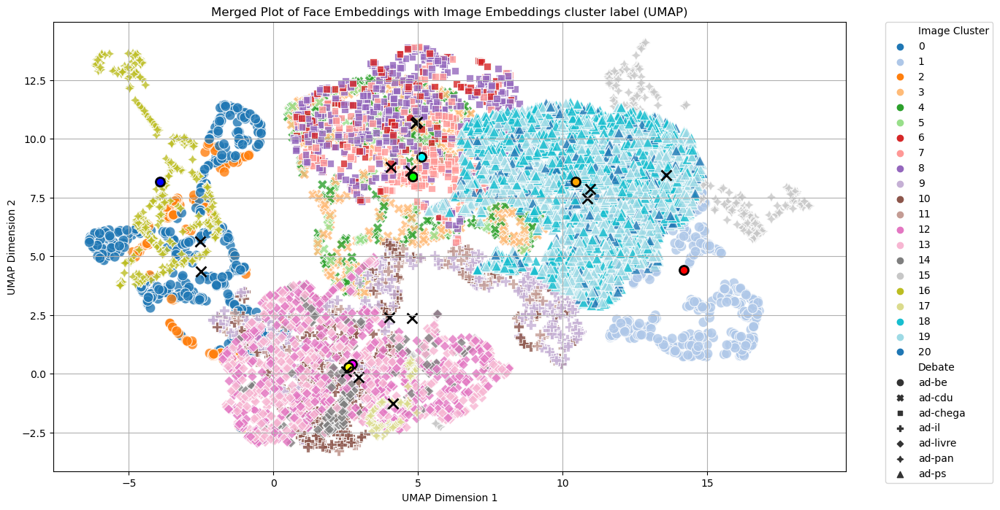

In [499]:
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df_face_merged, x='UMAP1', y='UMAP2', hue='Image Cluster', style='Debate', palette='tab20', s=100, alpha=0.8)

color_map = {
    1: 'red', # ad-be
    3: 'lime', # ad-cdu
    7: 'cyan', # ad-chega
    10: 'magenta', # ad-il
    12: 'yellow', # ad-livre
    16: 'blue', # ad-pan
    18: 'orange' # ad-ps
}

centroids = {}
for cluster in df_face_merged['Image Cluster'].unique():
    centroid = df_face_merged[df_face_merged['Image Cluster'] == cluster][['UMAP1', 'UMAP2']].mean().values
    centroids[cluster] = centroid
    if cluster in color_map: # Hardcoded: Montenegro clusters
        plt.scatter(centroid[0], centroid[1], marker='o', color=color_map[cluster], s=75, linewidths=2, edgecolor='black')
    else:
        plt.scatter(centroid[0], centroid[1], marker='x', color='black', s=100, linewidths=2, edgecolor='black')

plt.title("Merged Plot of Face Embeddings with Image Embeddings cluster label (UMAP)")
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.show()

### The colored centroids corresponded to Montenegro, the selected party.

### We conclude that using the centroids of the face embeddings with the clustering of image embeddings does not provide a robust way to do person identification. Thus, our hypothesis fails.

## Finally, we conclude that using image and face embeddings is not sufficient to do person identification through different debates.

------------------------------
# Authors
<p style="font-size: 20px; line-height: 1.2;">
<strong>Diogo Miranda (96190)</strong><br>
<strong>João Martins (99983)</strong><br>
<strong>Miguel Bandeira (100035)</strong>
</p>